In [1]:
from PIL import Image
img = Ima'/home/ubuntu/NF54gamplusring_20151223/SNAP-144314-0001.jpg'ge.open('/home/ubuntu/NF54gamplusring_20151223/SNAP-144314-0001.jpg')

In [22]:
%matplotlib inline

TypeError: constructor returned NULL

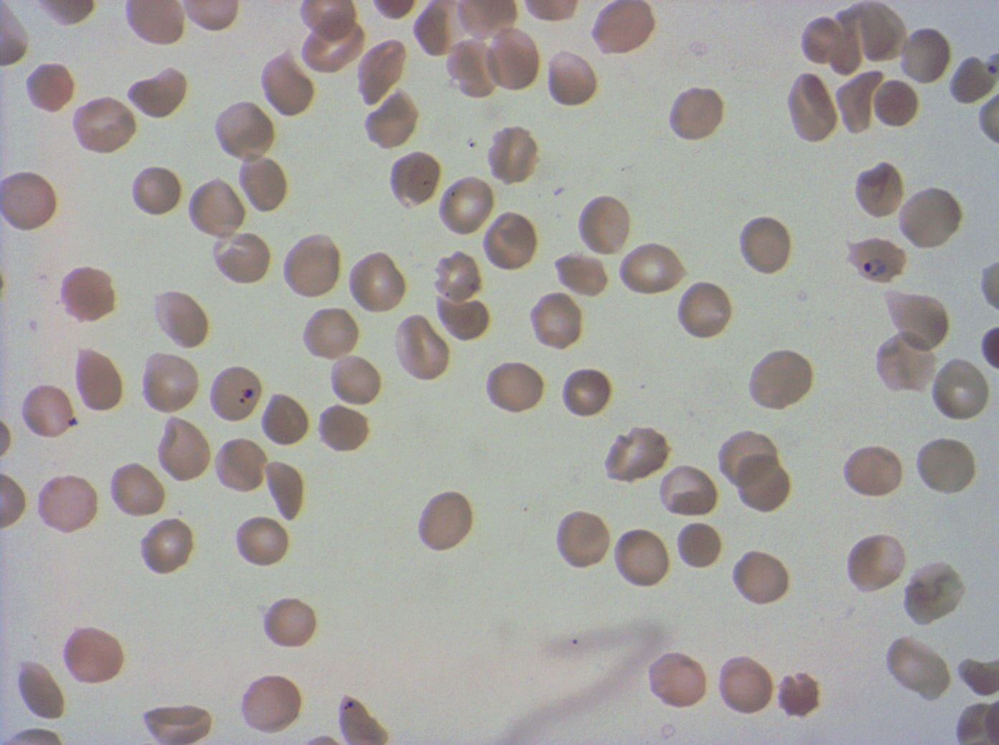

In [23]:
from IPython.display import Image
Image('/home/ubuntu/NF54gamplusring_20151223/SNAP-144314-0001.jpg')
#Image('/home/ubuntu/NF54gamplusring_20151223/SNAP-154757-0002.tif')
#Image('/home/ubuntu/NF54gamplusring_20151223/SNAP-154854-0003.tif')

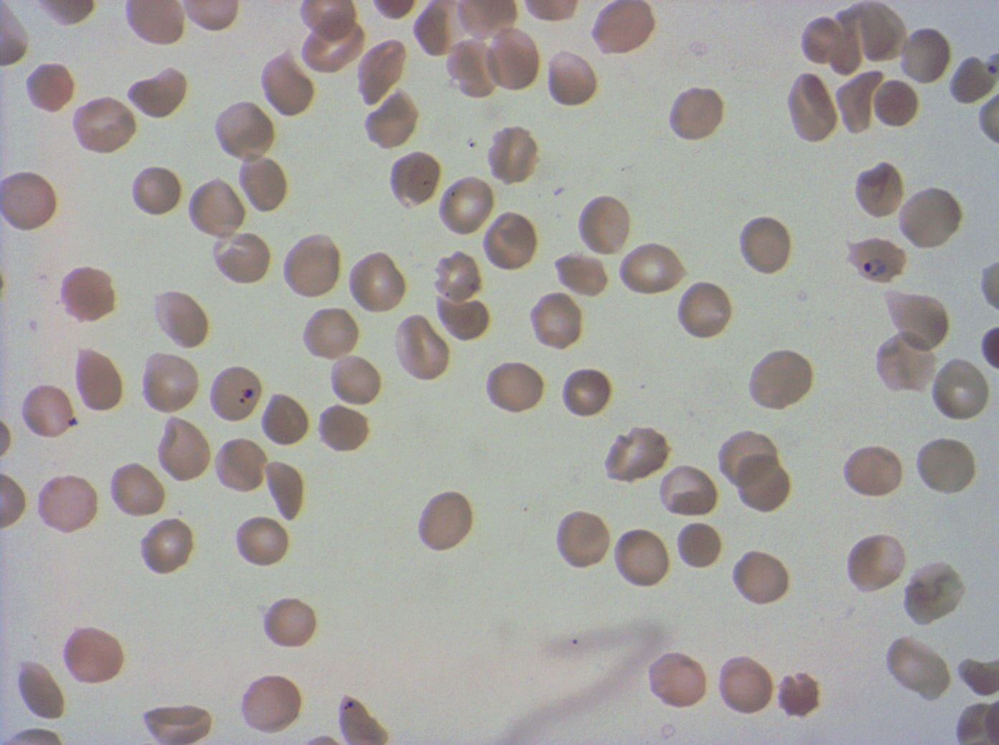

In [28]:

#import matplotlib.pyplot as plt
import numpy as np
from PIL import Image


Image.open('/home/ubuntu/NF54gamplusring_20151223/SNAP-144314-0001.jpg', 'r')
#plt.imshow(np.asarray(pil_im))

In [6]:
import pickle
pickle.load(open('/home/ubuntu/py-faster-rcnn/output/faster_rcnn_alt_opt/test/VGG_CNN_M_1024_faster_rcnn_final/detections.pkl'))
#detections.pkl <- all_boxes (3D array: class index, image index, bounding box and class probability of detections of class in image)

[[[],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  []

In [61]:
detections=pickle.load(open('/home/ubuntu/py-faster-rcnn/output/faster_rcnn_alt_opt/test/VGG_CNN_M_1024_faster_rcnn_final/detections.pkl'))
print len(detections)
print len(detections[0]), len(detections[1]), len(detections[2]), len(detections[3]), len(detections[4])
print detections[1][0].shape, detections[2][0].shape
print detections[1][1].shape, detections[2][1].shape
print detections[1,1,1]

5
286 286 286 286 286
(41, 5) (40, 5)
(29, 5) (38, 5)


TypeError: list indices must be integers, not tuple

(1038, 1392, 3)


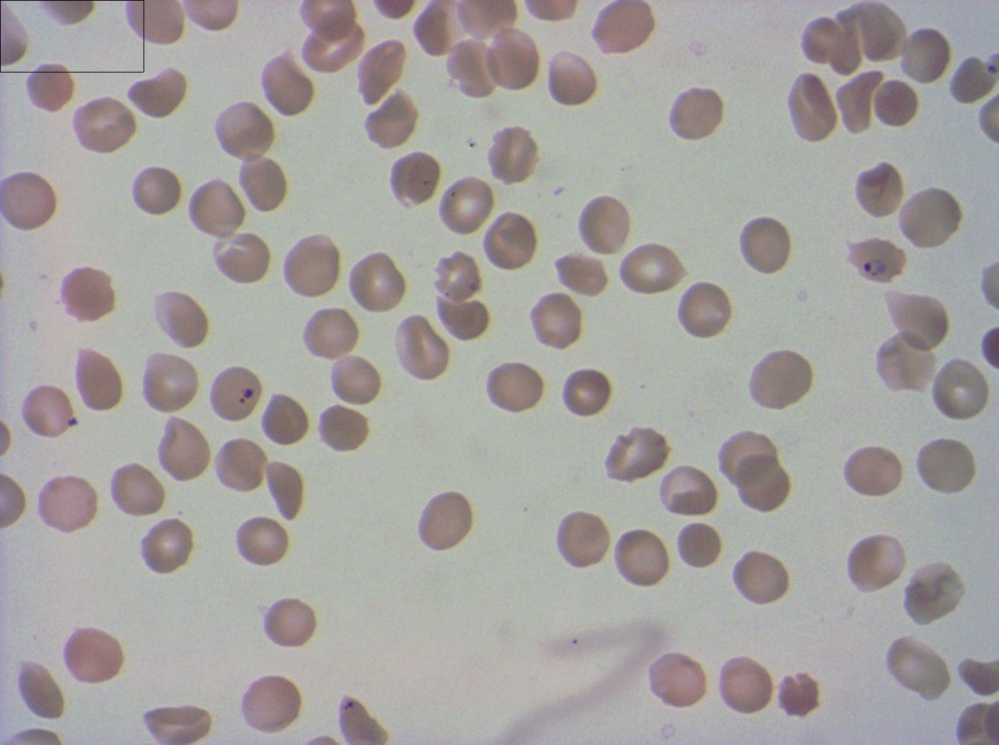

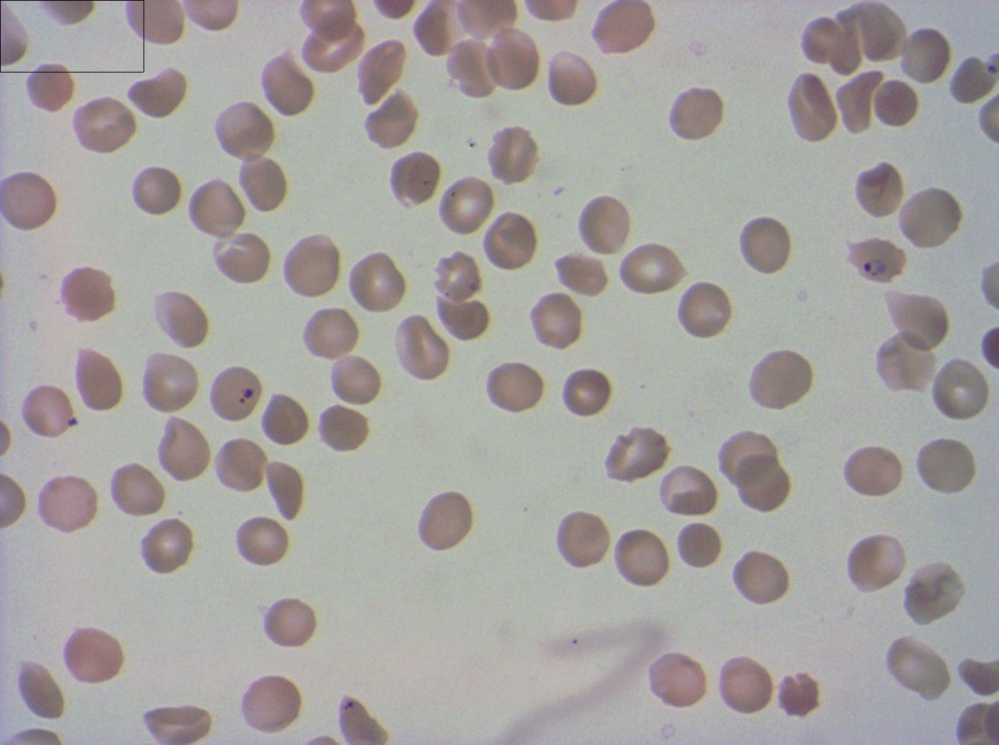

In [66]:
import numpy as np
from PIL import Image
pil_im = np.asarray(Image.open('/home/ubuntu/NF54gamplusring_20151223/SNAP-144314-0001.jpg'))
pil_im = pil_im.copy()
print pil_im.shape
from IPython.display import display
'''
addition = np.zeros((pil_im.shape[0], pil_im.shape[1]))
for i in range(500):
    addition[i,i]=105
print pil_im[:,:,0].shape
pil_im[:,:,0] += addition
'''
''' 
for i in range(pil_im.shape[0]):
    for j in range(pil_im.shape[1]):
        pil_im[i, j, :] = 0
''' 
for i in range(100):
    pil_im[i,0,:]=0
    pil_im[i,200,:]=0
for j in range(200):
    pil_im[0, j, :] = 0
    pil_im[100, j, :] = 0

display(Image.fromarray(pil_im,'RGB'))
Image.fromarray(pil_im,'RGB')

In [60]:
import numpy as np
from PIL import Image
from IPython.display import display
#obtain detections
detections=pickle.load(open('/home/ubuntu/py-faster-rcnn/output/faster_rcnn_alt_opt/test/VGG_CNN_M_1024_faster_rcnn_final/detections.pkl'))

#obtain list of test images in order
test_files = []
with open('/home/ubuntu/try1/data/ImageSets/test.txt') as f:
    for file_ in f.readlines():
        test_files.append(file_.strip())
#print test_files

THRESHOLD = 0.5
#for each test image, for each class get the bounding box coordinates of the objects with probability >= THRESHOLD
#for each filtered detection, draw a colored box 
for file_index, file_ in enumerate(test_files):
    print file_
    #get numpy array of image 
    pil_im = np.asarray(Image.open(file_))
    pil_im = pil_im.copy()
    
    for cls in range(1,len(detections)):
        
        filtered_boxes = [detections[cls][file_index][ii][0:4] for ii in range(len(detections[cls][file_index])) if detections[cls][file_index][ii][-1] >= THRESHOLD]
        for box in filtered_boxes:
            if cls ==1:
                for i in range(box[0], box[2]+1):
                    pil_im[i,box[1], :] = 0
                    pil_im[i,box[3]+1, :] = 0
                for j in range(box[1], box[3]+1):
                    pil_im[box[0], j, :] = 0
                    pil_im[box[2]+1, j, :] = 0
            elif cls ==2:
                for i in range(box[0], box[2]+1):
                    pil_im[i,box[1], 0] = 255
                    pil_im[i,box[3]+1, 0] = 255
                for j in range(box[1], box[3]+1):
                    pil_im[box[0], j, 0] = 255
                    pil_im[box[2]+1, j, 0] = 255
            elif cls ==3:
                for i in range(box[0], box[2]+1):
                    pil_im[i,box[1], 1] = 255
                    pil_im[i,box[3]+1, 1] = 255
                for j in range(box[1], box[3]+1):
                    pil_im[box[0], j, 1] = 255
                    pil_im[box[2]+1, j, 1] = 255
            elif cls ==4:
                for i in range(box[0], box[2]+1):
                    pil_im[i,box[1], 2] = 255
                    pil_im[i,box[3]+1, 2] = 255
                for j in range(box[1], box[3]+1):
                    pil_im[box[0], j, 2] = 255
                    pil_im[box[2]+1, j, 2] = 255
    display(Image.fromarray(pil_im,'RGB'))
    
                